In [1]:
import requests
page = requests.get("https://www.worldometers.info/coronavirus")

In [2]:
page.status_code

200

b'\n<!DOCTYPE html>\n<!--[if IE 8]> <html lang="en" class="ie8"> <![endif]-->\n<!--[if IE 9]> <html lang="en" class="ie9"> <![endif]-->\n<!--[if !IE]><!-->\n<html lang="en">\n<!--<![endif]-->\n<head>\n<meta charset="utf-8">\n<meta http-equiv="X-UA-Compatible" content="IE=edge">\n<meta name="viewport" content="width=device-width, initial-scale=1">\n<title>Coronavirus Update (Live): 2,552,157 Cases and 177,230 Deaths from COVID-19 Virus Pandemic - Worldometer</title>\n<meta name="description" content="Live statistics and coronavirus news tracking the number of confirmed cases, recovered patients, tests, and death toll due to the COVID-19 coronavirus from Wuhan, China. Coronavirus counter with new cases, deaths, and number of tests per 1 Million population. Historical data and info. Daily charts, graphs, news and updates">\n\n<link rel="shortcut icon" href="/favicon/favicon.ico" type="image/x-icon">\n<link rel="apple-touch-icon" sizes="57x57" href="/favicon/apple-icon-57x57.png">\n<link r
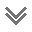

In [3]:
page.content

In [4]:
#importing the BeautifulSoup library
from bs4 import BeautifulSoup

In [5]:
#Instatiating the BeautifulSoup Class
soup = BeautifulSoup(page.content, 'html.parser')
#Where soup is a variable containing the HTML of the webpage

<!DOCTYPE html>
<!--[if IE 8]> <html lang="en" class="ie8"> <![endif]-->
<!--[if IE 9]> <html lang="en" class="ie9"> <![endif]-->
<!--[if !IE]><!-->
<html lang="en">
 <!--<![endif]-->
 <head>
  <meta charset="utf-8"/>
  <meta content="IE=edge" http-equiv="X-UA-Compatible"/>
  <meta content="width=device-width, initial-scale=1" name="viewport"/>
  <title>
   Coronavirus Update (Live): 2,552,157 Cases and 177,230 Deaths from COVID-19 Virus Pandemic - Worldometer
  </title>
  <meta content="Live statistics and coronavirus news tracking the number of confirmed cases, recovered patients, tests, and death toll due to the COVID-19 coronavirus from Wuhan, China. Coronavirus counter with new cases, deaths, and number of tests per 1 Million population. Historical data and info. Daily charts, graphs, news and updates" name="description"/>
  <link href="/favicon/favicon.ico" rel="shortcut icon" type="image/x-icon"/>
  <link href="/favicon/apple-icon-57x57.png" rel="apple-touch-icon" sizes="57x57"/
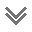

In [6]:
#Lets formatt it nicely, using the prettify method as contrasts as cell 3
print(soup.prettify())

### After inspection, we have seen the table we to extract

In [8]:
# Search for the table and extracting it
table = soup.find('table', attrs={'id': 'main_table_countries_today'})

In [9]:
# Print the first 10 rows for sanity check
rows = table.find_all('tr')
print(rows[:10])

[<tr>
<th width="100">Country,<br>Other</br></th>
<th width="20">Total<br>Cases</br></th>
<th width="30">New<br>Cases</br></th>
<th width="30">Total<br>Deaths</br></th>
<th width="30">New<br>Deaths</br></th>
<th width="30">Total<br>Recovered</br></th>
<th width="30">Active<br>Cases</br></th>
<th width="30">Serious,<br/>Critical</th>
<th width="30">Tot Cases/<br/>1M pop</th>
<th width="30">Deaths/<br/>1M pop</th>
<th width="30">Total<br/>Tests</th>
<th width="30">Tests/<br/>
<nobr>1M pop</nobr>
</th>
<th style="display:none" width="30">Continent</th>
</tr>, <tr class="total_row_world row_continent" data-continent="North America" style="display: none">
<td style="text-align:left;">
<nobr>North America</nobr>
</td>
<td>877,227</td>
<td>+25,831</td>
<td>48,287</td>
<td>+2,854</td>
<td>100,115</td>
<td>728,825</td>
<td>15,278</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td data-continent="North America" style="display:none;">North America</td>
</tr>, <tr class="total_row_world row_continen

In [10]:
for row in rows:
    row_td = row.find_all('td')
print(row_td)
type(row_td)

[<td><strong>Total:</strong></td>, <td>2,552,157</td>, <td style="background-color:#FFEEAA; color:#000;">+71,654</td>, <td>177,230</td>, <td style="background-color:red; color:#fff">+6,833</td>, <td>688,412</td>, <td>1,686,515</td>, <td>57,254</td>, <td>327.4</td>, <td>22.7</td>, <td></td>, <td></td>, <td data-continent="all" style="display:none">All</td>]


bs4.element.ResultSet

In [11]:
str_cells = str(row_td)
cleantext = BeautifulSoup(str_cells, "lxml").get_text()
print(cleantext)

[Total:, 2,552,157, +71,654, 177,230, +6,833, 688,412, 1,686,515, 57,254, 327.4, 22.7, , , All]


In [12]:
import re

list_rows = []
for row in rows:
    cells = row.find_all('td')
    str_cells = str(cells)
    clean = re.compile('<.*?>')
    clean2 = (re.sub(clean, '',str_cells))
    list_rows.append(clean2)
print(clean2)
type(clean2)


[Total:, 2,552,157, +71,654, 177,230, +6,833, 688,412, 1,686,515, 57,254, 327.4, 22.7, , , All]


str

In [14]:
import pandas as pd
df = pd.DataFrame(list_rows)
df.head(10)

,0
0,[]
1,"[\nNorth America\n, 877,227, +25,831, 48,287, ..."
2,"[\nEurope\n, 1,139,767, +26,671, 107,853, +3,3..."
3,"[\nAsia\n, 409,881, +13,412, 15,491, +359, 191..."
4,"[\nSouth America\n, 91,136, +4,650, 4,307, +22..."
5,"[\nOceania\n, 8,189, +25, 84, +1, 5,730, 2,375..."
6,"[\nAfrica\n, 25,236, +1,065, 1,193, +29, 6,739..."
7,"[\n\n, 721, , 15, , 644, 62, 7, , , , , ]"
8,"[World, 2,552,157, +71,654, 177,230, +6,833, 6..."
9,"[USA, 816,336, +23,577, 45,172 , <td style=""fo..."


In [15]:
df1 = df[0].str.split(',', expand=True)
df1.head(10)

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
0,[],None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
1,[\nNorth America\n,877,227,+25,831,48,287,+2,854,100,...,278,,,,,North America],None,None,None,None
2,[\nEurope\n,1,139,767,+26,671,107,853,+3,362,...,26,042,,,,,Europe],None,None,None
3,[\nAsia\n,409,881,+13,412,15,491,+359,191,957,...,,,,,Asia],None,None,None,None,None
4,[\nSouth America\n,91,136,+4,650,4,307,+228,38,407,...,,,,,South America],None,None,None,None,None
5,[\nOceania\n,8,189,+25,84,+1,5,730,2,375,...,,Australia/Oceania],None,None,None,None,None,None,None,None
6,[\nAfrica\n,25,236,+1,065,1,193,+29,6,739,...,,,,Africa],None,None,None,None,None,None
7,[\n\n,721,,15,,644,62,7,,,...,None,None,None,None,None,None,None,None,None,None
8,[World,2,552,157,+71,654,177,230,+6,833,...,515,57,254,327,22.7,,,All],None,None
9,[USA,816,336,+23,577,45,172,"<td style=""font-weight: bold; \n ...",658,82,...,016,2,466,136,4,177,832,12,622,North America]


In [16]:
df1[0] = df1[0].str.strip('[')
df1.head(10)

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
0,],None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
1,\nNorth America\n,877,227,+25,831,48,287,+2,854,100,...,278,,,,,North America],None,None,None,None
2,\nEurope\n,1,139,767,+26,671,107,853,+3,362,...,26,042,,,,,Europe],None,None,None
3,\nAsia\n,409,881,+13,412,15,491,+359,191,957,...,,,,,Asia],None,None,None,None,None
4,\nSouth America\n,91,136,+4,650,4,307,+228,38,407,...,,,,,South America],None,None,None,None,None
5,\nOceania\n,8,189,+25,84,+1,5,730,2,375,...,,Australia/Oceania],None,None,None,None,None,None,None,None
6,\nAfrica\n,25,236,+1,065,1,193,+29,6,739,...,,,,Africa],None,None,None,None,None,None
7,\n\n,721,,15,,644,62,7,,,...,None,None,None,None,None,None,None,None,None,None
8,World,2,552,157,+71,654,177,230,+6,833,...,515,57,254,327,22.7,,,All],None,None
9,USA,816,336,+23,577,45,172,"<td style=""font-weight: bold; \n ...",658,82,...,016,2,466,136,4,177,832,12,622,North America]


In [17]:
col_labels = soup.find_all('th')

In [18]:
all_header = []
col_str = str(col_labels)
cleantext2 = BeautifulSoup(col_str, "lxml").get_text()
all_header.append(cleantext2)
print(all_header)

['[Country,Other, TotalCases, NewCases, TotalDeaths, NewDeaths, TotalRecovered, ActiveCases, Serious,Critical, Tot\xa0Cases/1M pop, Deaths/1M pop, TotalTests, Tests/\n1M pop\n, Continent, Country,Other, TotalCases, NewCases, TotalDeaths, NewDeaths, TotalRecovered, ActiveCases, Serious,Critical, Tot\xa0Cases/1M pop, Deaths/1M pop, TotalTests, Tests/\n1M pop\n, Continent]']


In [19]:
df2 = pd.DataFrame(all_header)
df2.head()

,0
0,"[Country,Other, TotalCases, NewCases, TotalDea..."


In [20]:
df3 = df2[0].str.split(',', expand=True)
df3.head()

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
0,[Country,Other,TotalCases,NewCases,TotalDeaths,NewDeaths,TotalRecovered,ActiveCases,Serious,Critical,...,NewDeaths,TotalRecovered,ActiveCases,Serious,Critical,Tot Cases/1M pop,Deaths/1M pop,TotalTests,Tests/\n1M pop\n,Continent]


In [21]:
frames = [df3, df1]

df4 = pd.concat(frames)
df4.head(10)


,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
0,[Country,Other,TotalCases,NewCases,TotalDeaths,NewDeaths,TotalRecovered,ActiveCases,Serious,Critical,...,NewDeaths,TotalRecovered,ActiveCases,Serious,Critical,Tot Cases/1M pop,Deaths/1M pop,TotalTests,Tests/\n1M pop\n,Continent]
0,],None,None,None,None,None,None,None,None,None,...,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN
1,\nNorth America\n,877,227,+25,831,48,287,+2,854,100,...,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN
2,\nEurope\n,1,139,767,+26,671,107,853,+3,362,...,Europe],None,None,None,NaN,NaN,NaN,NaN,NaN,NaN
3,\nAsia\n,409,881,+13,412,15,491,+359,191,957,...,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN
4,\nSouth America\n,91,136,+4,650,4,307,+228,38,407,...,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN
5,\nOceania\n,8,189,+25,84,+1,5,730,2,375,...,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN
6,\nAfrica\n,25,236,+1,065,1,193,+29,6,739,...,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN
7,\n\n,721,,15,,644,62,7,,,...,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN
8,World,2,552,157,+71,654,177,230,+6,833,...,,All],None,None,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
df5 = df4.rename(columns=df4.iloc[0])
df5.head()

,[Country,Other,TotalCases,NewCases,TotalDeaths,NewDeaths,TotalRecovered,ActiveCases,Serious,Critical,...,NewDeaths,TotalRecovered,ActiveCases,Serious,Critical,Tot Cases/1M pop,Deaths/1M pop,TotalTests,Tests/\n1M pop\n,Continent]
0,[Country,Other,TotalCases,NewCases,TotalDeaths,NewDeaths,TotalRecovered,ActiveCases,Serious,Critical,...,NewDeaths,TotalRecovered,ActiveCases,Serious,Critical,Tot Cases/1M pop,Deaths/1M pop,TotalTests,Tests/\n1M pop\n,Continent]
0,],None,None,None,None,None,None,None,None,None,...,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN
1,\nNorth America\n,877,227,+25,831,48,287,+2,854,100,...,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN
2,\nEurope\n,1,139,767,+26,671,107,853,+3,362,...,Europe],None,None,None,NaN,NaN,NaN,NaN,NaN,NaN
3,\nAsia\n,409,881,+13,412,15,491,+359,191,957,...,None,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
content_table = soup.find('table', attrs={'id': 'main_table_countries_today'})ce

In [ ]:
or row in content_table.find_all('tr'):
    table = 
    popular = [td for cell in tr.stripped_strings]
    print(popular)

In [11]:
for row in content_table.find_all('tr'):
    for cell in content_table.find_all('td'):
        print(cell.text) 


North America

870,500
+19,104
47,738
+2,305
98,667
724,095
15,278




North America

Europe

1,139,650
+26,554
107,781
+3,290
344,820
687,049
26,042




Europe

Asia

408,786
+12,317
15,449
+317
191,255
202,082
6,224




Asia

South America

88,699
+2,213
4,147
+68
38,407
46,145
9,475




South America

Oceania

8,189
+25
84
+1
5,730
2,375
54




Australia/Oceania

Africa

25,148
+977
1,190
+26
6,708
17,250
174




Africa



721

15

644
62
7





World
2,541,693
+61,190
176,404
+6,007
686,231
1,679,058
57,254
326
22.6


All
USA
809,615
+16,856
44,623  
+2,109
81,817
683,175
14,016
2,446
135
4,114,719
12,431
North America
Spain
204,178
+3,968
21,282 
+430
82,514
100,382
7,705
4,367
455
930,230
19,896
Europe
Italy
183,957
+2,729
24,648 
+534
51,600
107,709
2,471
3,043
408
1,450,150
23,985
Europe
France
158,050
+2,667
20,796 
+531
39,181
98,073
5,433
2,421
319
463,662
7,103
Europe
Germany
148,174
+1,109
4,961 
+99
95,200
48,013
2,889
1,769
59
1,728,357
20,629
Europe
UK
129,044
+4,301
1

In [12]:
import csv

In [ ]:
with open('inex.html', 'a',as csv ):
    writer = csv.writer(csv_file)
